# Wine Quality Prediction

### *Katherine Li*

## Intro

Whether you are a sommelier or not, it is interesting to see how data science can be leveraged into predicting the quality of wine. This project is based on an open source [dataset](https://archive.ics.uci.edu/ml/datasets/wine+quality) from the UCI Machine Learning Repository, and will be focusing on the red wines for the time being. (Looking forward to merge in the white wines data!) 

Before we get started, let's breif on some wine vocabulary that might come along sooner or later. Wines contain varying proportions of sugars, alcohol, acids, salts, pigments, nitrogenous substances, vitamins, sulfur dioxide and much more. Wines can be categorized by many features, and *the goal of this project is to see if any of those features impact the quality (ratings) granted to the wines.* **The last section include applying and comparing the results of logistic regression, support vector machine, decision tree, and random forest for ordinal data analysis, binary data analysis (unbalanced dataset), and categorical data analysis.**

*In wine tasting*, **acidity** is one of the, if not the most important feature that wine taster care aboout. There are three primary acids, which are tartaric, malic and citric acids. They are evaluated in relation to how well the acidity balances out the sweetness and bitter components of the wine, such as tannins.
1. *pH*: solutions with a pH value less than 7 are considered acidic, with some of the strongest acids being close to 0. Solutions above 7 are considered alkaline or basic
2. *Fixed Acidity/Titratable acidity*: a measurement of the total concentration of titratable acids and free hydrogen ions present in your wine
3. *Citric Acid*: quite rare, used to be a preservactive, added to increase acidity
4. *Volatile Acidity*: caused by error in the production, and has to do with the flavor and aroma, usually the unpleasant
5. *Density*: can be used to measure the alcohol concentration in wines; sweeter wines generally have higher densities
6. *Residual Sugars*: refers to any natural grape sugars that are leftover after fermentation ceases; dry wines typically have all sugar converted during the wine making
7. *Sulphates*: adds in the "sharp" taste of solutions
8. *Alcohol*: straightforward, the higher the alcohol is, most likely you will get dizzy/fuzzy easier


In [41]:
import numpy as np
import pandas as pd
from time import time
from IPython.display import display

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')



*First, load the dataset and take a peep at it.*

From the output, we see that there are 12 features for each wine on record, and the wine is rated in a range of 1-10. From the missing information check, we see that there is no N/A cells present.


In [42]:

# Load the Red Wines dataset
data = pd.read_csv("C:/Users/liyxk/OneDrive/Documents/GoGetIt/Github Files/winedata/winequality-red.csv", sep=';')

# Display the first five records
display(data.head(n=5))

# Display the data types for entries
data.info()

# Check N/A's
data.isnull().any()


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
fixed acidity           1599 non-null float64
volatile acidity        1599 non-null float64
citric acid             1599 non-null float64
residual sugar          1599 non-null float64
chlorides               1599 non-null float64
free sulfur dioxide     1599 non-null float64
total sulfur dioxide    1599 non-null float64
density                 1599 non-null float64
pH                      1599 non-null float64
sulphates               1599 non-null float64
alcohol                 1599 non-null float64
quality                 1599 non-null int64
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


fixed acidity           False
volatile acidity        False
citric acid             False
residual sugar          False
chlorides               False
free sulfur dioxide     False
total sulfur dioxide    False
density                 False
pH                      False
sulphates               False
alcohol                 False
quality                 False
dtype: bool

## Preliminary Analysis

###  Some Basic Summarization for the Features in the Data

Here, we can take a grasp on useful information as in the mean, median, mode, range and standard deviation of the features in the data.


In [43]:
display(np.round(data.describe()))

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0,1599.0
mean,8.0,1.0,0.0,3.0,0.0,16.0,46.0,1.0,3.0,1.0,10.0,6.0
std,2.0,0.0,0.0,1.0,0.0,10.0,33.0,0.0,0.0,0.0,1.0,1.0
min,5.0,0.0,0.0,1.0,0.0,1.0,6.0,1.0,3.0,0.0,8.0,3.0
25%,7.0,0.0,0.0,2.0,0.0,7.0,22.0,1.0,3.0,1.0,10.0,5.0
50%,8.0,1.0,0.0,2.0,0.0,14.0,38.0,1.0,3.0,1.0,10.0,6.0
75%,9.0,1.0,0.0,3.0,0.0,21.0,62.0,1.0,3.0,1.0,11.0,6.0
max,16.0,2.0,1.0,16.0,1.0,72.0,289.0,1.0,4.0,2.0,15.0,8.0


### Distribution of Wines Based on Quality

*Classify wines based on the ratings they receive.* <br>
Scores of 7 and above: very good; <br>
Scores of 5 to 6: average; <br>
Scpres of 4 and below: insipid

From the result, we can see that there are 1599 wines included in this analysis, among which 217 are considered of "very good quality", 63 are considered as "insipid quality", and 1319 are "average" wines with quality scores in the middle. The very good wines make up 13.57% of all the wines included. 

In [44]:
n_wines = data.shape[0]

# Number of wines with quality rating above 6
quality_above_6 = data.loc[(data['quality'] > 6)]
n_above_6 = quality_above_6.shape[0]

# Number of wines with quality rating below 5
quality_below_5 = data.loc[(data['quality'] < 5)]
n_below_5 = quality_below_5.shape[0]

# Number of wines with quality rating between 5 to 6
quality_between_5 = data.loc[(data['quality'] >= 5) & (data['quality'] <= 6)]
n_between_5 = quality_between_5.shape[0]

# Percentage of wines with quality rating above 6
greater_percent = n_above_6*100/n_wines

# Print the results
print("Total number of wine data: {}".format(n_wines))
print("Wines with rating 7 and above: {}".format(n_above_6))
print("Wines with rating less than 5: {}".format(n_below_5))
print("Wines with rating 5 and 6: {}".format(n_between_5))
print("Percentage of wines with quality 7 and above: {:.2f}%".format(greater_percent))


Total number of wine data: 1599
Wines with rating 7 and above: 217
Wines with rating less than 5: 63
Wines with rating 5 and 6: 1319
Percentage of wines with quality 7 and above: 13.57%


## Data Visualization

Since the dataset contains a bunch of features, i.e. alcohol levels, amount of residual sugar and pH value. Some features might be dependent on others, some might not. 

### Distribution of Wines Based on Features

From the scatterplot, we can see that the distribution for some features are pretty linear. For others, they seem to be negatively skewed. We can conclude that there might be some correlation/co-dependencies between some of the features.

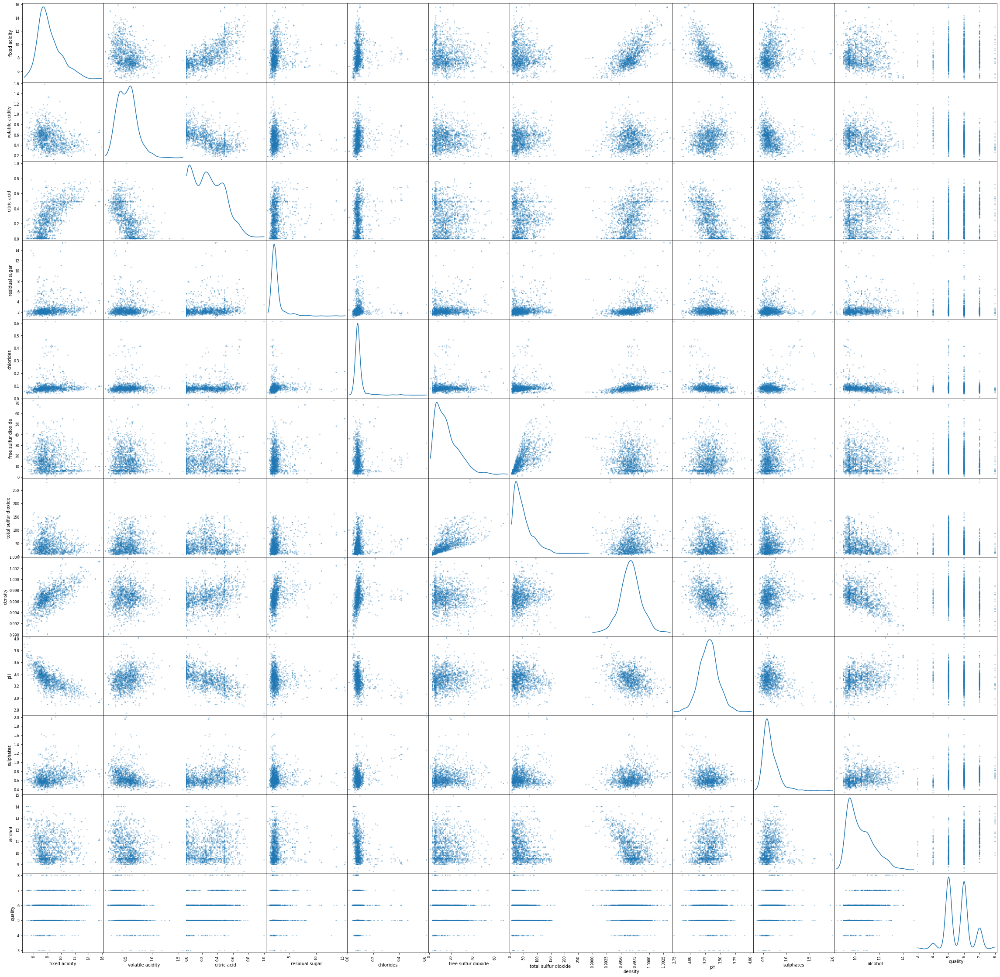

In [45]:
pd.plotting.scatter_matrix(data, alpha = 0.3, figsize = (40,40), diagonal = 'kde');


### Correlation Heatmap of the Features

The **positive** values show positive/direct co-relationships between features, which means if one feature increases, the other one increases, and vice versa. The higher the values, the stronger the relationships are, the "redder" the corresponding squares appear. 

The **negative** values show negative/inverse co-relationships between features, which means if one feature increases, the other one decreases, and vice versa. The higher the values, the stronger the relationships are, the "bluer" the corresponding squares appear. 

**Zero** means no correlation between the set of the two features.

**So, according to the correlation plot below...**

Quality has a positive relationship between alcohol <br>
Quality has a negative weak relationship between volitile_acidicity <br>
Quality has almost no relationship between residual_sugar, free_sulfur_dioxide, and pH.(corr =~ 0) <br>

Alcohol has a positive relationship between quality and weakly pH <br>
Alcohol has a negative relationship between density <br>
Alcohol has almost no relationship between fixed_acidicity, residual_sugar, free_sulfur_dioxide, sulphates <br>

Density has positive relationship between fixed_acidicity <br>
Density has negative relationship between density <br>
Density has almost no relationship between volitile_acidicity, free_sulfur_dioxide, total_sulfur_dioxide <br>

Volitile acidicity has a weak positive relationship between pH <br>
Volitile acidicity has a strong negative relationship between citric_acid <br>
Volitile acidicity has weak negative relationship between fixed_acidicity and sulphates <br>
Volitile acidicity has almost no relationship between residual_sugar, chlorides, free_sulfur_dioxide, total_sulfur_dioxide, density <br>


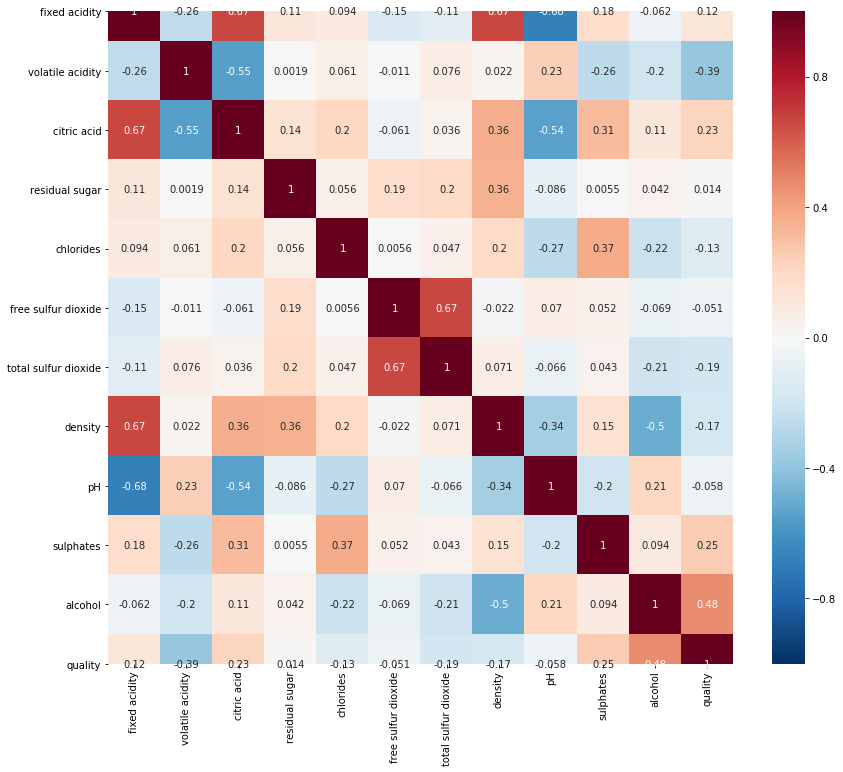

In [46]:
correlation = data.corr()
# display(correlation)
plt.figure(figsize=(14, 12))
heatmap = sns.heatmap(correlation, annot=True, linewidths=0, vmin=-1, cmap="RdBu_r")

## Some Relationships

### Fixed Acidity vs. Critic Acid

These two are apparently positively correlated. As the critic acid goes up, the fixed acidity goes up. 

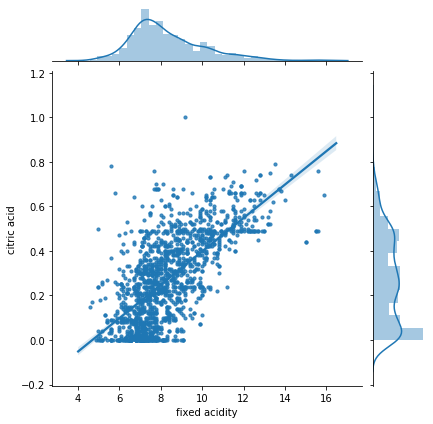

In [47]:
fixedAcidity_citricAcid = data[['citric acid', 'fixed acidity']]
g = sns.JointGrid(x="fixed acidity", y="citric acid", data=fixedAcidity_citricAcid, size=6)
g = g.plot_joint(sns.regplot, scatter_kws={"s": 10})
g = g.plot_marginals(sns.distplot)

### pH vs. Fixed Acidity

Intuitively, as the fixed acidity intensifies, the pH level drops. The data viz below verifies this point.  


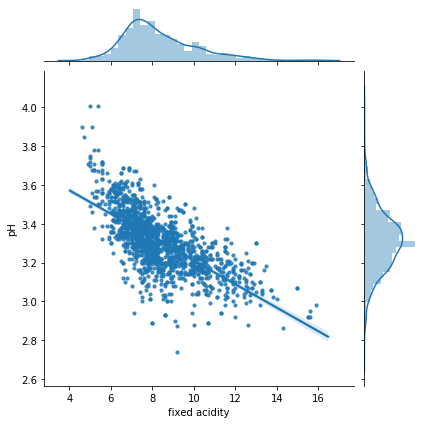

In [48]:
fixedAcidity_pH = data[['pH', 'fixed acidity']]

#Initialize a joint-grid with the dataframe, using seaborn library
gridA = sns.JointGrid(x="fixed acidity", y="pH", data=fixedAcidity_pH, size=6)

#Draws a regression plot in the grid 
gridA = gridA.plot_joint(sns.regplot, scatter_kws={"s": 10})

#Draws a distribution plot in the same grid
gridA = gridA.plot_marginals(sns.distplot)

### Fixed Acidity vs. Density 


This is actually an interesting finding - as the fixed acidity level goes up, the density goes up as well. Thus, the sweeter the wine is, the more acid that it contains (which means is sourer?)


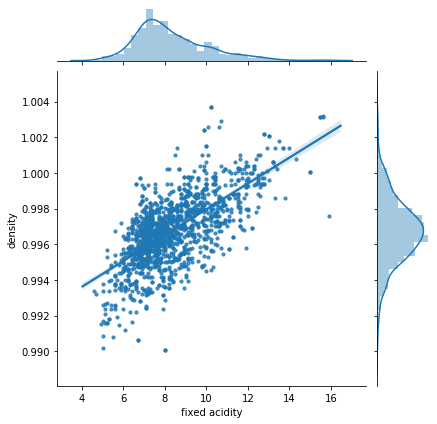

In [49]:
fixedAcidity_density = data[['density', 'fixed acidity']]

#Initialize a joint-grid with the dataframe, using seaborn library
gridA = sns.JointGrid(x="fixed acidity", y="density", data=fixedAcidity_density, size=6)

#Draws a regression plot in the grid 
gridA = gridA.plot_joint(sns.regplot, scatter_kws={"s": 10})

#Draws a distribution plot in the same grid
gridA = gridA.plot_marginals(sns.distplot)

### Quality vs. Alcohol

From this graph, it appears the higher-rating wines are more clustered around wines with higher concentration of alcohol. 


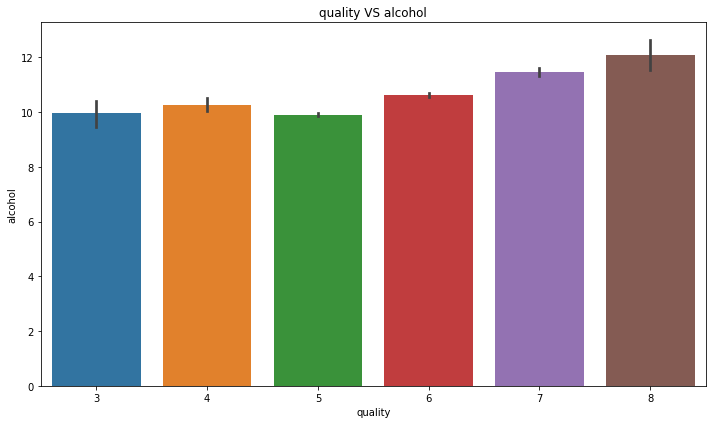

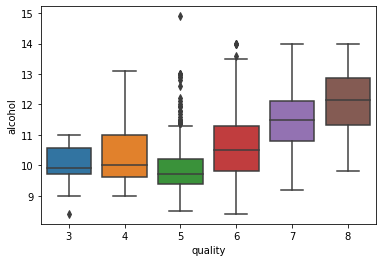

In [50]:
quality_alcohol = data[['quality', 'alcohol']]

fig, axs = plt.subplots(ncols=1,figsize=(10,6))
sns.barplot(x='quality', y='alcohol', data=quality_alcohol, ax=axs)
plt.title('quality VS alcohol')
plt.tight_layout()
plt.show()
plt.gcf().clear()

sns.boxplot('quality', 'alcohol', data = data)


### Quality vs. Volatile Acidity

From this graph, it appears the higher-rating wines are more clustered around wines with lower volatile acidity levels, which makes sense intuitively. 

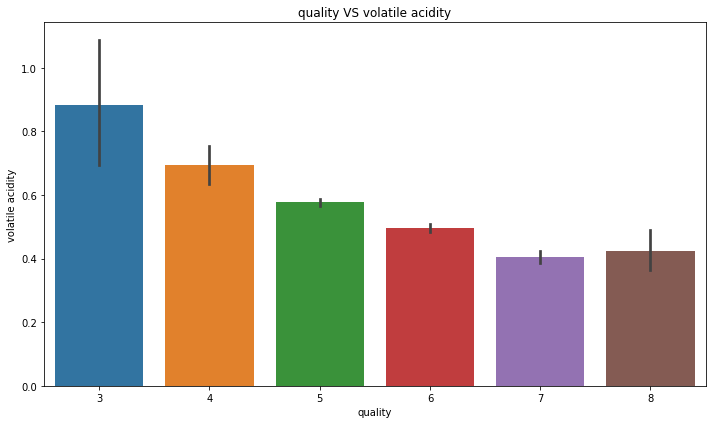

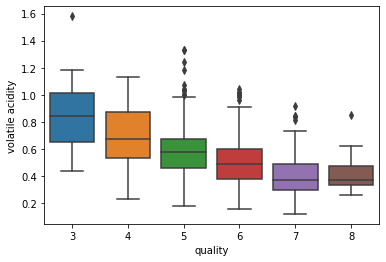

In [51]:
volatileAcidity_quality = data[['quality', 'volatile acidity']]


fig, axs = plt.subplots(ncols=1,figsize=(10,6))
sns.barplot(x='quality', y='volatile acidity', data=volatileAcidity_quality, ax=axs)
plt.title('quality VS volatile acidity')
plt.tight_layout()
plt.show()
plt.gcf().clear()

sns.boxplot('quality', 'volatile acidity', data = data)


## Classification & Cross Validation

**I. Logistic Regression <br>
<br>
II. SVM<br>
<br>
III. Decision Tree<br>
<br>
IV. Random Forest**
<br>

First, we conduct the preliminaries by creating functions for normalization, splitting data for train and test sets, application of cross validation, etc.

In [52]:
#Fucntion Part
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit
import graphviz  
from sklearn.externals.six import StringIO
from IPython.display import Image 

#Normalization ==> x_norm = (x - mean)/std 
#it gives each value the same value intervals means between 0-1
def normalization(X):
    mean = np.mean(X)
    std = np.std(X)
    X_t = (X - mean)/std
    return X_t

#Train and Test splitting of data     
def train_test(X_t, y):
    x_train, x_test, y_train, y_test = train_test_split(X_t, y, test_size = 0.3, random_state = 42)
    print("Train:",len(x_train), " - Test:", len(x_test))
    return x_train, x_test, y_train, y_test

def grid_search(name_clf, clf, x_train, x_test, y_train, y_test):
    if name_clf == 'Logistic_Regression':
        # Logistic Regression 
        log_reg_params = {"penalty": ['l1', 'l2'], 'C': [0.001, 0.01, 0.1, 1, 10, 100, 1000]}
        grid_log_reg = GridSearchCV(LogisticRegression(), log_reg_params)
        grid_log_reg.fit(x_train, y_train)
        # We automatically get the logistic regression with the best parameters.
        log_reg = grid_log_reg.best_estimator_
        print("Best Parameters for Logistic Regression: ", grid_log_reg.best_estimator_)
        print("Best Score for Logistic Regression: ", grid_log_reg.best_score_)
        print("------------------------------------------")
        return log_reg
    
    elif name_clf == 'SVM':
        # Support Vector Classifier
        svc_params = {'C':[0.0001, 0.001, 0.01, 0.1, 1.0, 10.0, 100.0, 1000.0],
                      'kernel': ['rbf', 'poly', 'sigmoid', 'linear']}
        grid_svc = GridSearchCV(SVC(), svc_params)
        grid_svc.fit(x_train, y_train)
        # SVC best estimator
        svc = grid_svc.best_estimator_
        print("Best Parameters for SVM: ", grid_svc.best_estimator_)
        print("Best Score for SVM: ", grid_svc.best_score_)
        print("------------------------------------------")
        return svc
    
    elif name_clf == 'Decision_Tree':
        # DecisionTree Classifier
        tree_params = {"criterion": ["gini", "entropy"], "max_depth": list(range(2,30,1)), 
                  "min_samples_leaf": list(range(5,20,1))}
        grid_tree = GridSearchCV(DecisionTreeClassifier(), tree_params)
        grid_tree.fit(x_train, y_train)
        # tree best estimator
        tree_clf = grid_tree.best_estimator_
        print("Best Parameters for Decision Tree: ", grid_tree.best_estimator_)
        print("Best Score for Decision Tree: ", grid_tree.best_score_)
        print("------------------------------------------")
        
        #FEATURE IMPORTANCE FOR DECISION TREE
        importnce = tree_clf.feature_importances_
        plt.figure(figsize=(10,10))
        plt.title("Feature Importances of Decision Tree")
        plt.barh(X_t.columns, importnce, align="center")
        
        return tree_clf
    
    elif name_clf == 'Random_Forest':
        forest_params = {"bootstrap":[True, False], "max_depth": list(range(2,10,1)), 
                  "min_samples_leaf": list(range(5,20,1))}
        grid_forest = GridSearchCV(RandomForestClassifier(), forest_params)
        grid_forest.fit(x_train, y_train)
        # forest best estimator
        forest_clf = grid_forest.best_estimator_
        print("Best Parameters for Random Forest: ", grid_forest.best_estimator_)
        print("Best Score for Random Forest: ", grid_forest.best_score_)
        print("------------------------------------------")
        
        #FEATURE IMPORTANCE FOR DECISION TREE
        importnce = forest_clf.feature_importances_
        plt.figure(figsize=(10,10))
        plt.title("Feature Importances of Random Forest")
        plt.barh(X_t.columns, importnce, align="center")
        
        return forest_clf
    
def plot_learning_curve(estimator,title, X, y, ylim=None, cv=None, n_jobs=None,
                        train_sizes=np.linspace(.1, 1.0, 5)):
    plt.figure()
    plt.title(title)
    if ylim is not None:
        plt.ylim(*ylim)
    plt.xlabel("Training examples")
    plt.ylabel("Score")
    train_sizes, train_scores, test_scores = learning_curve(estimator, X, y, cv=cv, 
                                                            n_jobs=n_jobs, train_sizes=train_sizes)
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    plt.grid()

    plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                     train_scores_mean + train_scores_std, alpha=0.1,
                     color="r")
    plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                     test_scores_mean + test_scores_std, alpha=0.1, color="g")
    plt.plot(train_sizes, train_scores_mean, 'o-', color="r",
             label="Training score")
    plt.plot(train_sizes, test_scores_mean, 'o-', color="g",
             label="Cross-validation score")

    plt.legend(loc="best")
    return plt

#Create the function for applying classification 
def apply_classification(name_clf, clf, x_train, x_test, y_train, y_test):
    #Find the best parameters and get the classification with the best parameters as return value of grid search
    grid_clf = grid_search(name_clf, clf, x_train, x_test, y_train, y_test)
    
    #Plotting the learning curve
    #The core curves, each time with 30% data randomly selected as a validation set.
    cv = ShuffleSplit(n_splits=10, test_size=0.3, random_state=42)
    plot_learning_curve(grid_clf, name_clf, x_train, y_train, 
                    ylim=(0.1, 1.01), cv=cv, n_jobs=4)
    
    #Apply cross validation to estimate the skills of models with 10 split with using best parameters
    scores = cross_val_score(grid_clf, x_train, y_train, cv=10)
    print("Mean Accuracy of Cross Validation: %", round(scores.mean()*100,2))
    print("Std of Accuracy of Cross Validation: %", round(scores.std()*100))
    print("------------------------------------------")
    
    #Predict the test data as selected classifier
    clf_prediction = grid_clf.predict(x_test)
    clf1_accuracy = sum(y_test == clf_prediction)/len(y_test)
    print("Accuracy of",name_clf,":",clf1_accuracy*100)
    
    #Print confusion matrix and accuracy score before best parameters
    clf1_conf_matrix = confusion_matrix(y_test, clf_prediction)
    print("Confusion matrix of",name_clf,":\n", clf1_conf_matrix)
    print("==========================================")
    return grid_clf

## Ordinal Dataset Analysis

In order to get good accuracy classification, this seciton includes grid search, cross validation, feature selection for noise, and etc. 


In [53]:
#Now seperate the dataset as response variable and feature variabes
X = data.drop(['quality'], axis = 1)
#y = pd.DataFrame(data['value'])
y = data['quality']

In [54]:
#Normalization
X_t = normalization(X)
print("X_t:", X_t.shape)

#Train and Test splitting of data 
x_train, x_test, y_train, y_test = train_test(X_t, y)

X_t: (1599, 11)
Train: 1119  - Test: 480


### I. Logistic Regression

Logistic regression is a predictive analytical method for datasets with one or more independent variables determining the outcome. The outcome is measured as a dichotomous variable with only two possibilities. It is used to predict a binary outcome (i.e. 1/0, Yes/No, True/False) given a set of independent variables. Logistic regression is a classification algorithm used to assign observations to a discrete set of classes. Here, we first use the ordinal data. 

*Formulation of the logistic regression: P= 1/(1+ e^(-(b_0+ b_1 x)))*

Best Parameters for Logistic Regression:  LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Best Score for Logistic Regression:  0.6041108132260947
------------------------------------------
Mean Accuracy of Cross Validation: % 60.49
Std of Accuracy of Cross Validation: % 5.0
------------------------------------------
Accuracy of Logistic_Regression : 56.666666666666664
Confusion matrix of Logistic_Regression :
 [[  0   0   1   0   0   0]
 [  0   0  11   6   0   0]
 [  0   0 150  45   0   0]
 [  0   0  80 114   6   0]
 [  0   0   4  49   8   0]
 [  0   0   0   2   4   0]]


LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

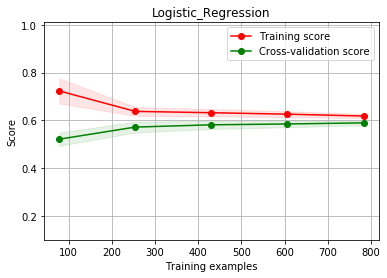

In [55]:
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
apply_classification('Logistic_Regression', lr, x_train, x_test, y_train, y_test)


### II. SVM

In machine learning, support-vector machines are supervised learning models with associated learning algorithms that analyze data for classification and regression analysis. Thus, two things are signals for a good SVM model, which are correct classifcation, and the maximized width of gap (margin) between the two categories. SVM is useful for non-linear classification by increasing dimension then find a new line classification in increased dimension. The C parameter is a key metric as it is related to the number of misclassified points in each of the training examples. For larger values of C, the optimized SVM will choose a smaller-margin hyperplane if that hyperplane does a better job of getting all the training points classified correctly. Conversely, a very small value of C will cause the optimizer to look for a larger-margin separating hyperplane, even if that hyperplane misclassifies more points. For very tiny values of C, there are misclassified examples, often due to the training data being linearly separable.


Best Parameters for SVM:  SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)
Best Score for SVM:  0.613047363717605
------------------------------------------
Mean Accuracy of Cross Validation: % 61.82
Std of Accuracy of Cross Validation: % 5.0
------------------------------------------
Accuracy of SVM : 60.62499999999999
Confusion matrix of SVM :
 [[  0   0   1   0   0   0]
 [  0   0  13   4   0   0]
 [  0   0 153  41   1   0]
 [  0   0  71 121   8   0]
 [  0   0   0  44  17   0]
 [  0   0   0   3   3   0]]


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

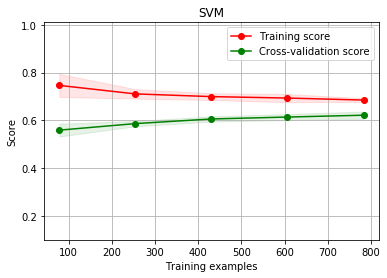

In [56]:
from sklearn.svm import SVC

svm = SVC()
apply_classification('SVM', svm, x_train, x_test, y_train, y_test)

### III. Decision Tree

Decision tree models/classification trees are where the target variable takes a discrete set of values; in these tree structures, leaves represent class labels and branches represent conjunctions of features that lead to those class labels. The standard deviation is used to calculate the homogeneity of a numerical sample. After each standard deviation calculations, standard deviation reduction is used to classify dataset. The standard deviation reduction is based on the decrease in standard deviation after a dataset is split on an attribute. Constructing a decision tree is all about finding attribute that returns the highest standard deviation reduction. The basic algorithm of the decision tree; recursive binary splitting. In this procedure, all the features are considered and different split points are tried and tested using a cost function. The split with the best cost (or lowest cost) is selected. The cost function is used to understand how model split and predict the split dataset classifications.


Best Parameters for Decision Tree:  DecisionTreeClassifier(class_weight=None, criterion='entropy', max_depth=4,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=17, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')
Best Score for Decision Tree:  0.5969615728328865
------------------------------------------
Mean Accuracy of Cross Validation: % 59.03
Std of Accuracy of Cross Validation: % 3.0
------------------------------------------
Accuracy of Decision_Tree : 53.333333333333336
Confusion matrix of Decision_Tree :
 [[  0   0   1   0   0   0]
 [  0   0  11   6   0   0]
 [  0   0 154  39   2   0]
 [  0   0  93  88  19   0]
 [  0   0   8  39  14   0]
 [  0   0   0   4   2   0]]


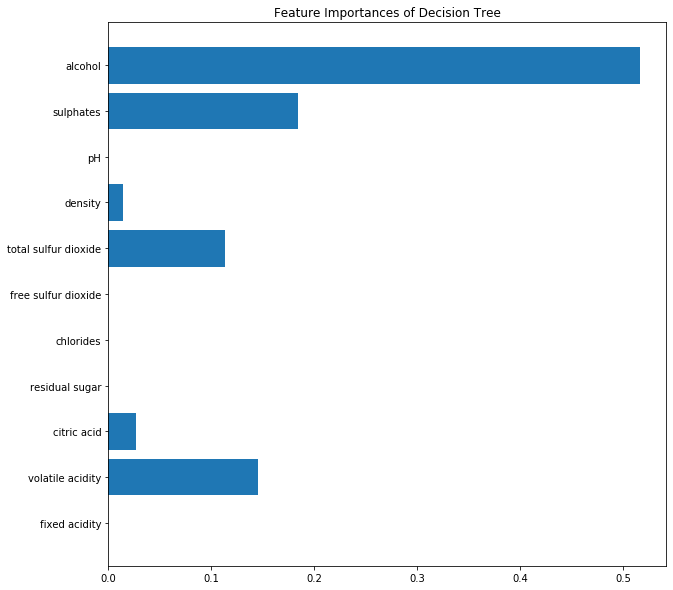

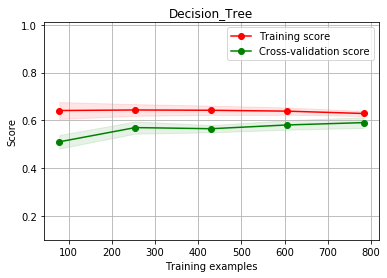

In [57]:
# feature selection

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz

from sklearn import tree

dt = DecisionTreeClassifier()
dt_clf = apply_classification('Decision_Tree', dt, x_train, x_test, y_train, y_test)

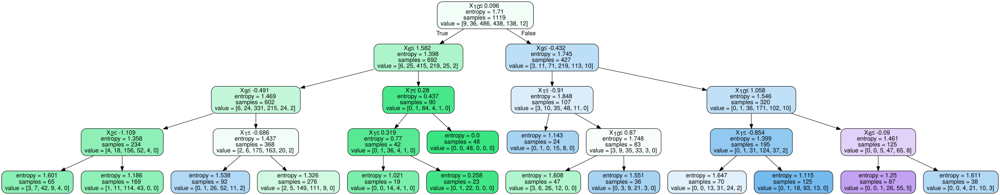

In [58]:
#Plot the decision tree 
dot_data = export_graphviz(dt_clf, out_file=None, filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
graph

### IV. Random Forest

Random forests or random decision forests are an ensemble learning method for classification, regression and other tasks that operates by constructing a multitude of decision trees at training time and outputting the class that is the mode of the classes or mean/average prediction of the individual trees. It tends to work better with data sets with a loss or unbalanced distribution. When new trees are added into the random forest, algorithm updates itself with decreasing the loss by eliminating noises. It is important to bootstrap (creating some mini sample dataset with less variable), then calculate with regression and pick the highly correlated, so first 2-3 split will be the same because of the central limit theorem.



Best Parameters for Random Forest:  RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=9, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=18, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Best Score for Random Forest:  0.6309204647006256
------------------------------------------
Mean Accuracy of Cross Validation: % 63.77
Std of Accuracy of Cross Validation: % 4.0
------------------------------------------
Accuracy of Random_Forest : 60.416666666666664
Confusion matrix of Random_Forest :
 [[  0   0   1   0   0   0]
 [  0   0   8   9   0   0]
 [  0   0 146  48   1   0]
 [  0   0  65 126   9   0]
 [  0   0   0  43  18   0]
 [  0   0   0   6   0   0]]


RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=9, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=18, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

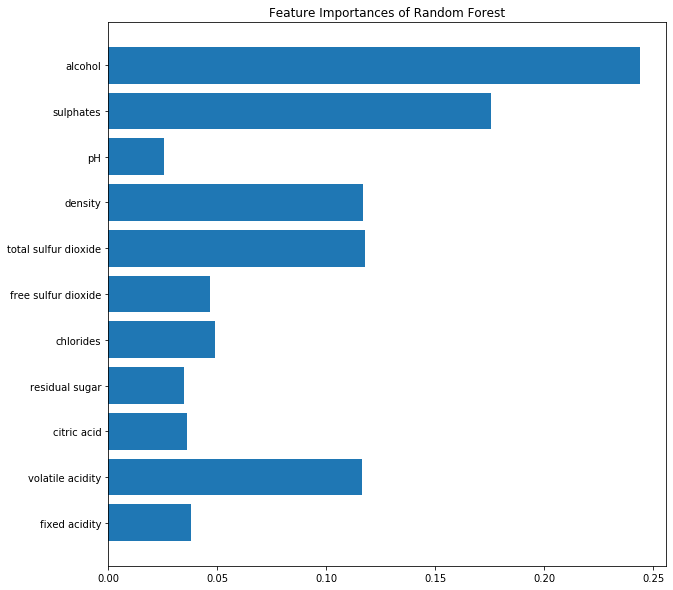

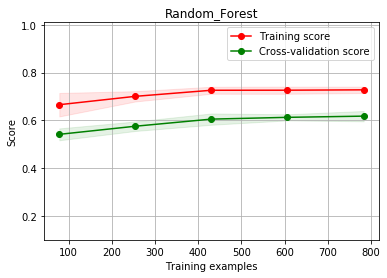

In [59]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=100)
apply_classification('Random_Forest', rf, x_train, x_test, y_train, y_test)

## Binary dataset Analysis

This dataset can be proper for classification and regression techniques because the data is multivariate, contains numeric values as an input and output value is ordered and not balanced. That being said... let's start with making data balanced.


In [60]:
#Add a new feature according to mean of the quality
#Good wine represented by 1, bad wine represented by 0
data['value'] = ""
data['value'] = [1 if each > 5 else 0 for each in data['quality']]

print("Good Wine Class:",data[data['value'] == 1].shape)
print("Bad Wine Class:",data[data['value'] == 0].shape)

Good Wine Class: (855, 13)
Bad Wine Class: (744, 13)


Now my data seems more balanced.

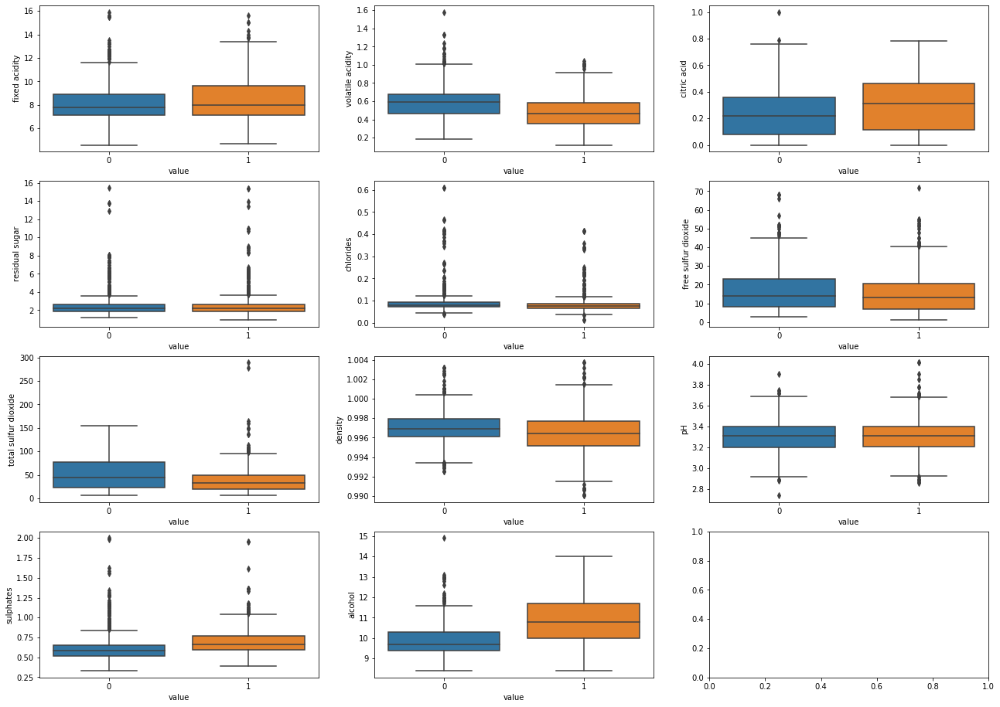

In [61]:
#Check the outliers for each feature with respect to output value
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.boxplot('value',data.iloc[:,k], data=data, ax = ax1[i][j])
            k += 1
plt.show()

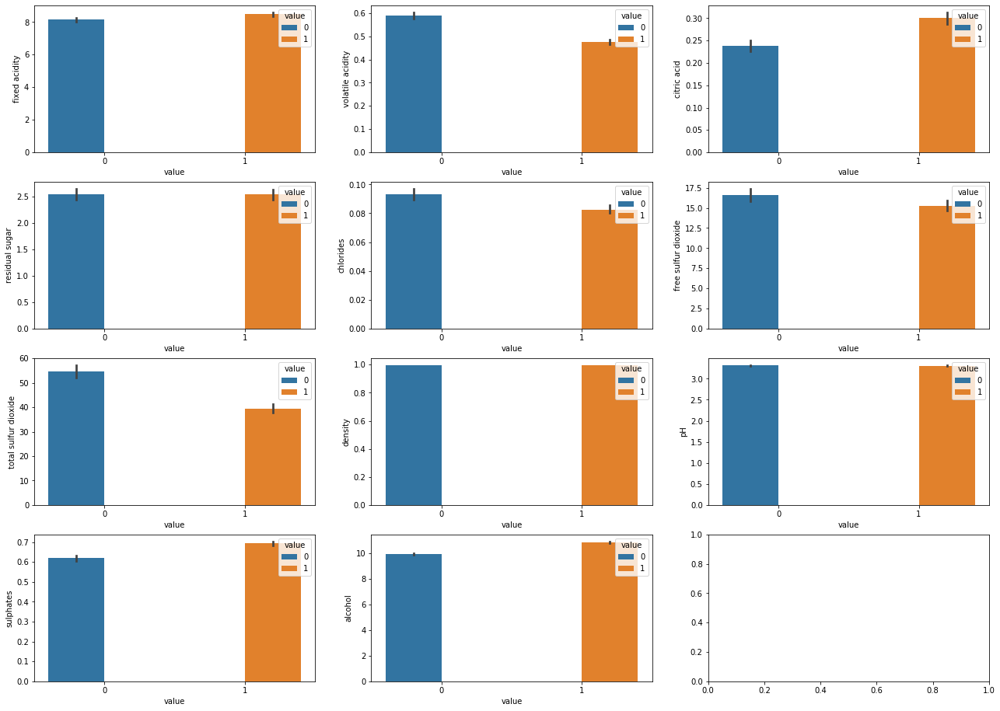

In [62]:
#Categorical distribution plots:
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.barplot(x="value",y=data.iloc[:,k],hue = 'value', data=data, ax = ax1[i][j])
            k += 1
plt.show()

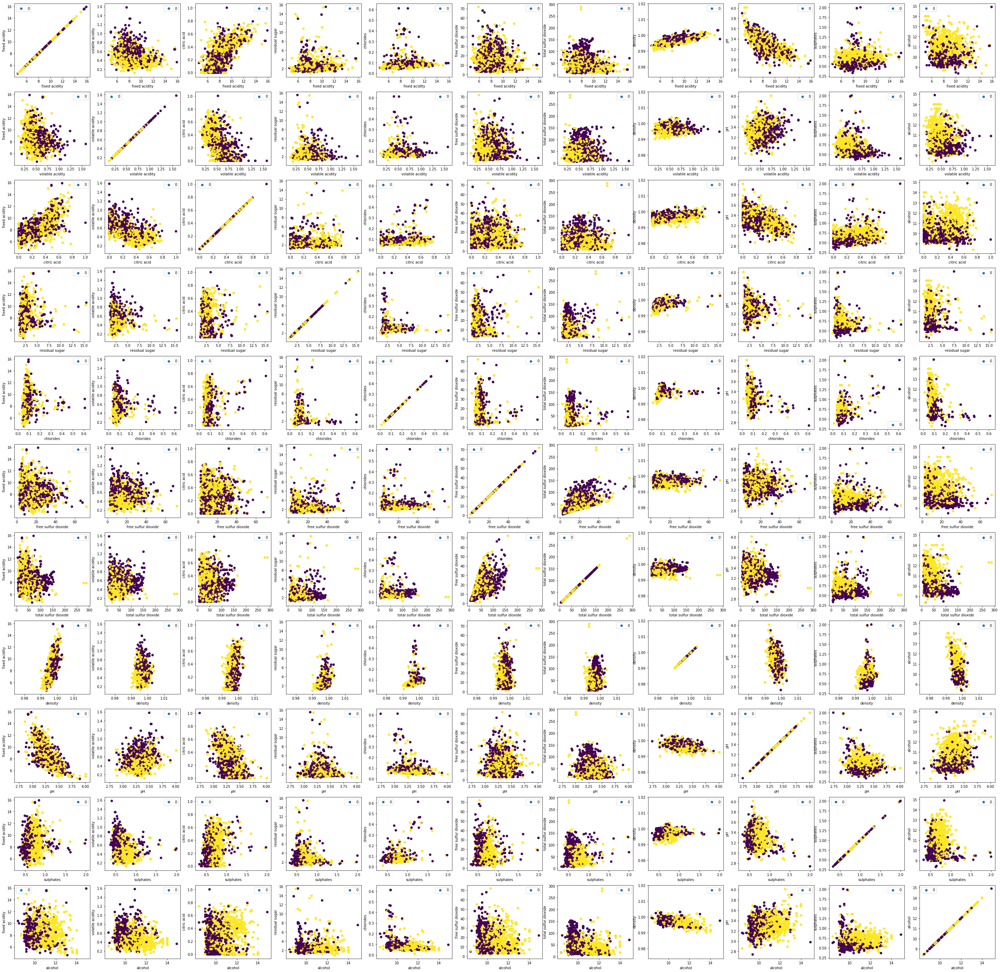

In [63]:
fig, axes = plt.subplots(11,11, figsize=(50,50))
for i in range(11):
    for j in range(11):
        axes[i, j].scatter(data.iloc[:,i], data.iloc[:,j], c = data.value)
        axes[i,j].set_xlabel(data.columns[i])
        axes[i,j].set_ylabel(data.columns[j])
        axes[i,j].legend(data.value)
plt.show()

In [64]:
#Now seperate the dataset as response variable and feature variabes
Xb = data.drop(['quality','value'], axis = 1)
#y = pd.DataFrame(data['value'])
yb = data['value']

#Normalization
Xb_t = normalization(Xb)
print("X_t:", Xb_t.shape)

#Train and Test splitting of data 
xb_train, xb_test, yb_train, yb_test = train_test(Xb_t, yb)

X_t: (1599, 11)
Train: 1119  - Test: 480


Best Parameters for Logistic Regression:  LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Best Score for Logistic Regression:  0.7479892761394102
------------------------------------------
Mean Accuracy of Cross Validation: % 75.62
Std of Accuracy of Cross Validation: % 6.0
------------------------------------------
Accuracy of Logistic_Regression : 73.75
Confusion matrix of Logistic_Regression :
 [[157  56]
 [ 70 197]]
Best Parameters for SVM:  SVC(C=10.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)
Best Score for SVM:  0.756925826

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=6, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=10, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

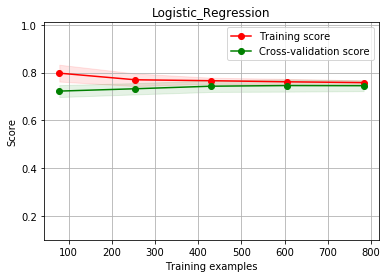

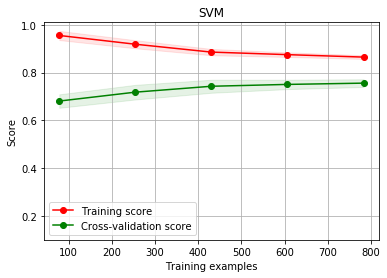

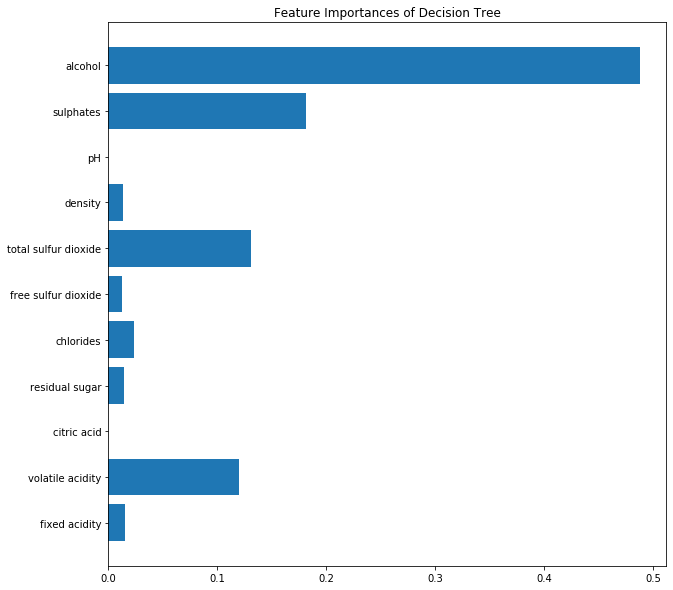

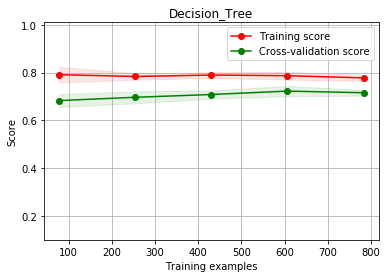

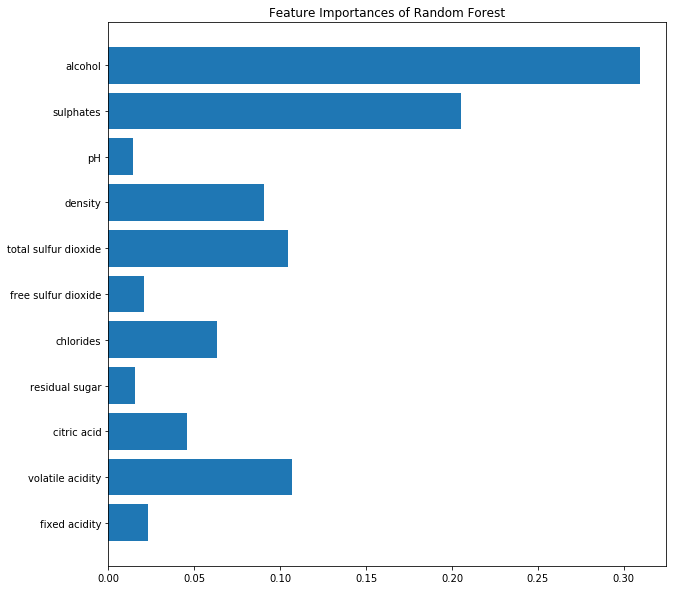

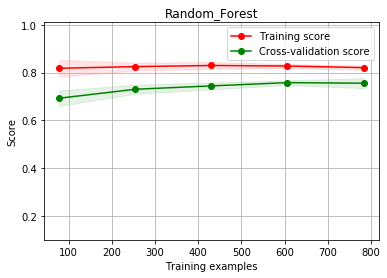

In [65]:
lrb = LogisticRegression()
apply_classification('Logistic_Regression', lrb, xb_train, xb_test, yb_train, yb_test)

svmb = SVC()
apply_classification('SVM', svmb, xb_train, xb_test, yb_train, yb_test)

dtb = DecisionTreeClassifier()
dtb_clf = apply_classification('Decision_Tree', dtb, xb_train, xb_test, yb_train, yb_test)

rfb = RandomForestClassifier(n_estimators=100)
apply_classification('Random_Forest', rfb, xb_train, xb_test, yb_train, yb_test)

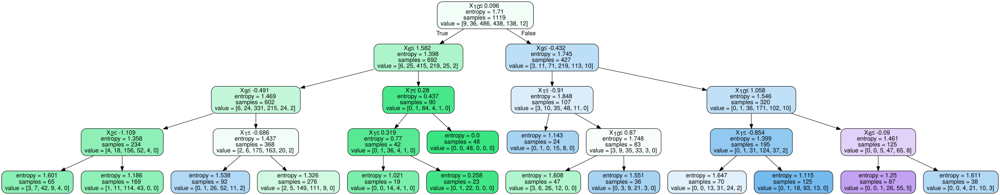

In [66]:
#Plot the decision tree 
dot_data = export_graphviz(dtb_clf, out_file=None, filled=True, rounded=True,special_characters=True)
graph

## Categorical Analysis

In [67]:
#Add a new feature according to mean of the quality
#Good wine represented by 2, average 1, and bad wine represented by 0
data['value'] = ""
data['value'] = [2 if each > 6 else 1 if ((each > 4) and (each < 7)) else 0 for each in data['quality']]

print("Good Wine Class:",data[data['value'] == 2].shape)
print("Average Wine Class:",data[data['value'] == 1].shape)
print("Bad Wine Class:",data[data['value'] == 0].shape)

Good Wine Class: (217, 13)
Average Wine Class: (1319, 13)
Bad Wine Class: (63, 13)


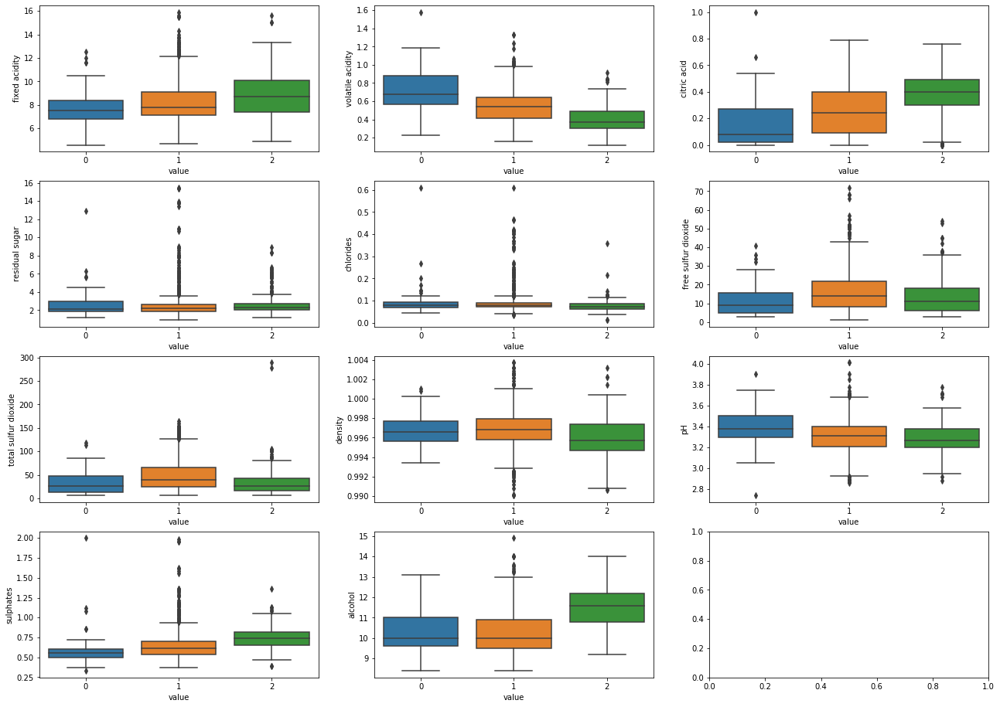

In [68]:
#Check the outliers for each feature with respect to output value
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.boxplot('value',data.iloc[:,k], data=data, ax = ax1[i][j])
            k += 1
plt.show()

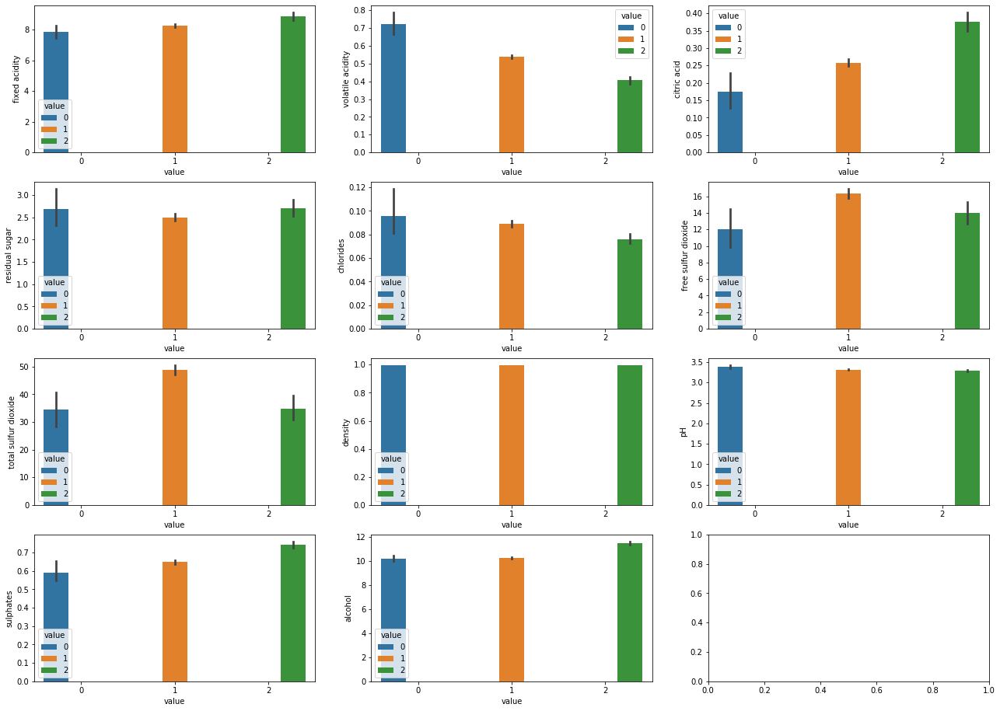

In [69]:
#Categorical distribution plots:
fig, ax1 = plt.subplots(4,3, figsize=(22,16))
k = 0
for i in range(4):
    for j in range(3):
        if k != 11:
            sns.barplot(x="value",y=data.iloc[:,k],hue = 'value', data=data, ax = ax1[i][j])
            k += 1
plt.show()

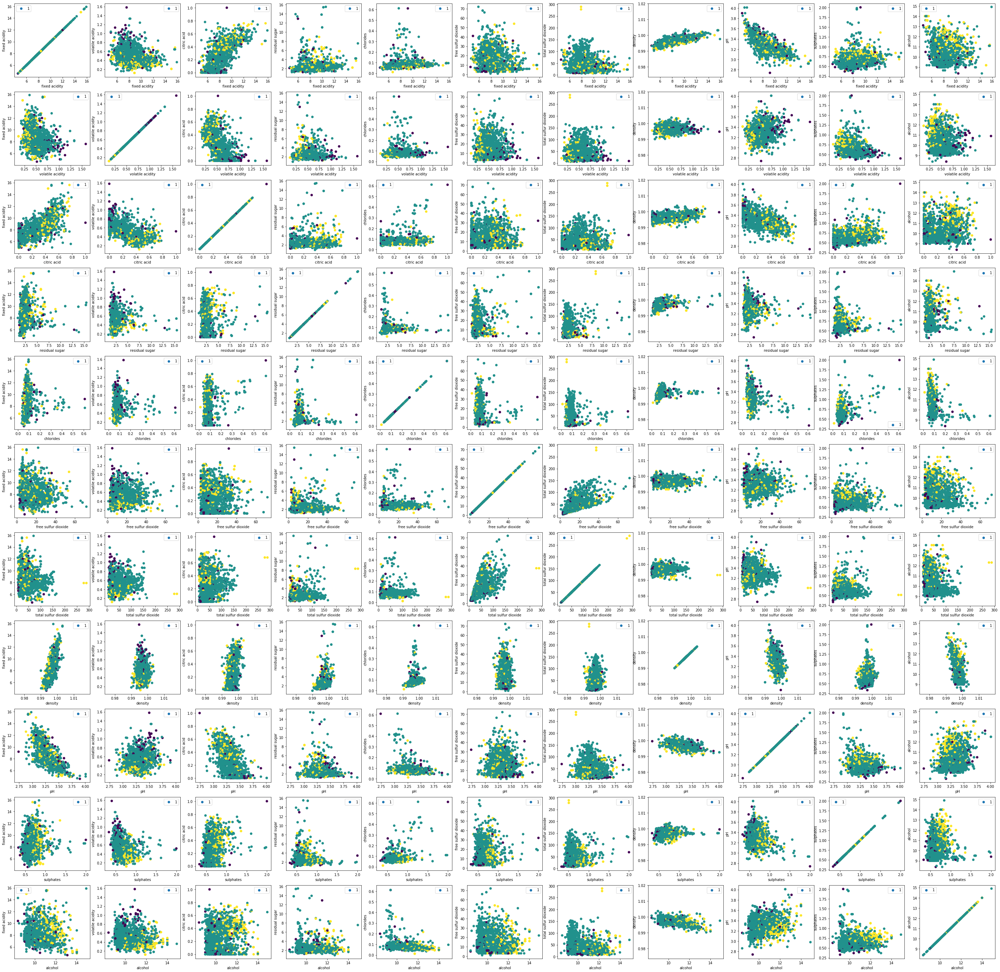

In [70]:
fig, axes = plt.subplots(11,11, figsize=(50,50))
for i in range(11):
    for j in range(11):
        axes[i, j].scatter(data.iloc[:,i], data.iloc[:,j], c = data.value)
        axes[i,j].set_xlabel(data.columns[i])
        axes[i,j].set_ylabel(data.columns[j])
        axes[i,j].legend(data.value)
plt.show()

In [71]:
#Now seperate the dataset as response variable and feature variabes
X3 = data.drop(['quality','value'], axis = 1)
#y = pd.DataFrame(data['value'])
y3 = data['value']

#Normalization
X3_t = normalization(X3)
print("X_t:", X3_t.shape)

#Train and Test splitting of data 
x3_train, x3_test, y3_train, y3_test = train_test(X3_t, y3)

X_t: (1599, 11)
Train: 1119  - Test: 480


And apply all four classification algorithms...


Best Parameters for Logistic Regression:  LogisticRegression(C=10, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l1',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)
Best Score for Logistic Regression:  0.8462913315460232
------------------------------------------
Mean Accuracy of Cross Validation: % 84.63
Std of Accuracy of Cross Validation: % 2.0
------------------------------------------
Accuracy of Logistic_Regression : 83.125
Confusion matrix of Logistic_Regression :
 [[  0  18   0]
 [  0 381  14]
 [  0  49  18]]
Best Parameters for SVM:  SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)
Best Sco

RandomForestClassifier(bootstrap=False, class_weight=None, criterion='gini',
                       max_depth=8, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=7, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

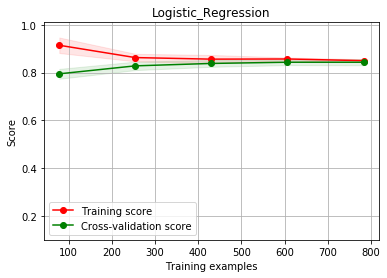

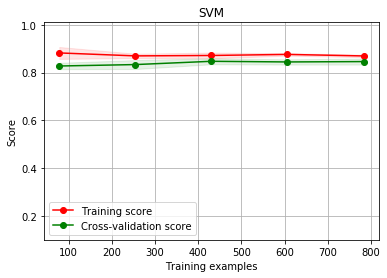

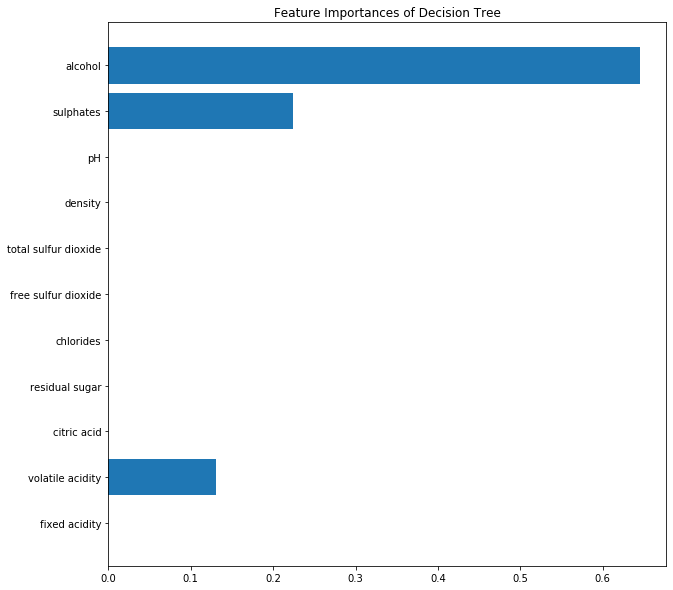

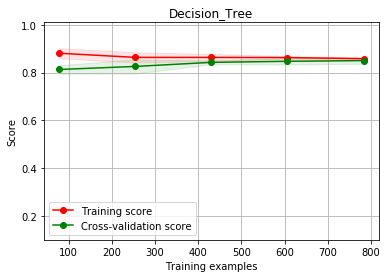

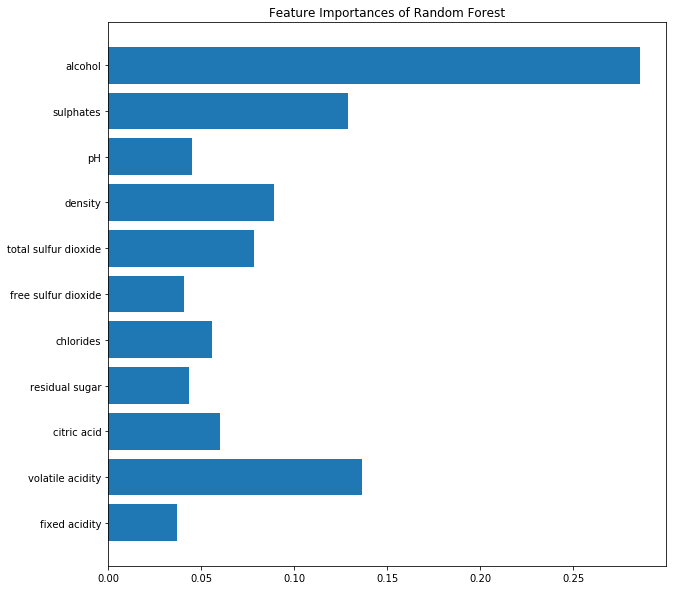

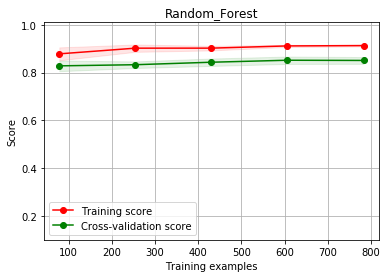

In [72]:
lr3 = LogisticRegression()
apply_classification('Logistic_Regression', lr3, x3_train, x3_test, y3_train, y3_test)

svm3 = SVC()
apply_classification('SVM', svm3, x3_train, x3_test, y3_train, y3_test)

dt3 = DecisionTreeClassifier()
dt3_clf = apply_classification('Decision_Tree', dt3, x3_train, x3_test, y3_train, y3_test)

rf3 = RandomForestClassifier(n_estimators=100)
apply_classification('Random_Forest', rf3, x3_train, x3_test, y3_train, y3_test)

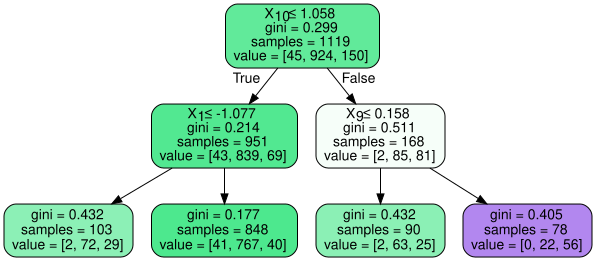

In [73]:
#Plot the decision tree 
dot_data = export_graphviz(dt3_clf, out_file=None, filled=True, rounded=True,special_characters=True)
graph = graphviz.Source(dot_data)
graph

## Conclusion

The binary classification showcases results with better accuracy in predicting the quality of wines. 

Among the four selected methods (logistic, SVM, DT, random forest), SVM and Random Forest give better models with prediction of higher accuracy rates for this dataset. 

### Some findings from this project include: 
 - Alcohol is the most important feature to decide quality of the wine, and usually, the higher the alcohol percentage is, the better the quality of the wine is
 - Sulphates is the second biggest indicator for good wines, as the higher the percentage of sulphates is, the better/higher-rated the quality of the wine is
 - The level of citric acidity is another criterion, normally the higher the level is, the better/higher-rated the wine is 
 - In the better wines, the levels of volatile acidity tend to be lower
 - In the better wines, the levels of sulfur dioxide tends to be lower 
 - Chlorides, though, has really nothing to do with the quality of the wine 
 
